In [13]:
import os
import ast
import shutil as sh
from pathlib import Path
import random

import numpy as np
import pandas as pd

import PIL

import torch

from tqdm.auto import tqdm

from IPython.display import Image, clear_output

import matplotlib.pyplot as plt
%matplotlib inline

In [14]:
!git clone https://github.com/ultralytics/yolov5  
!pip install -qr yolov5/requirements.txt  

fatal: destination path 'yolov5' already exists and is not an empty directory.


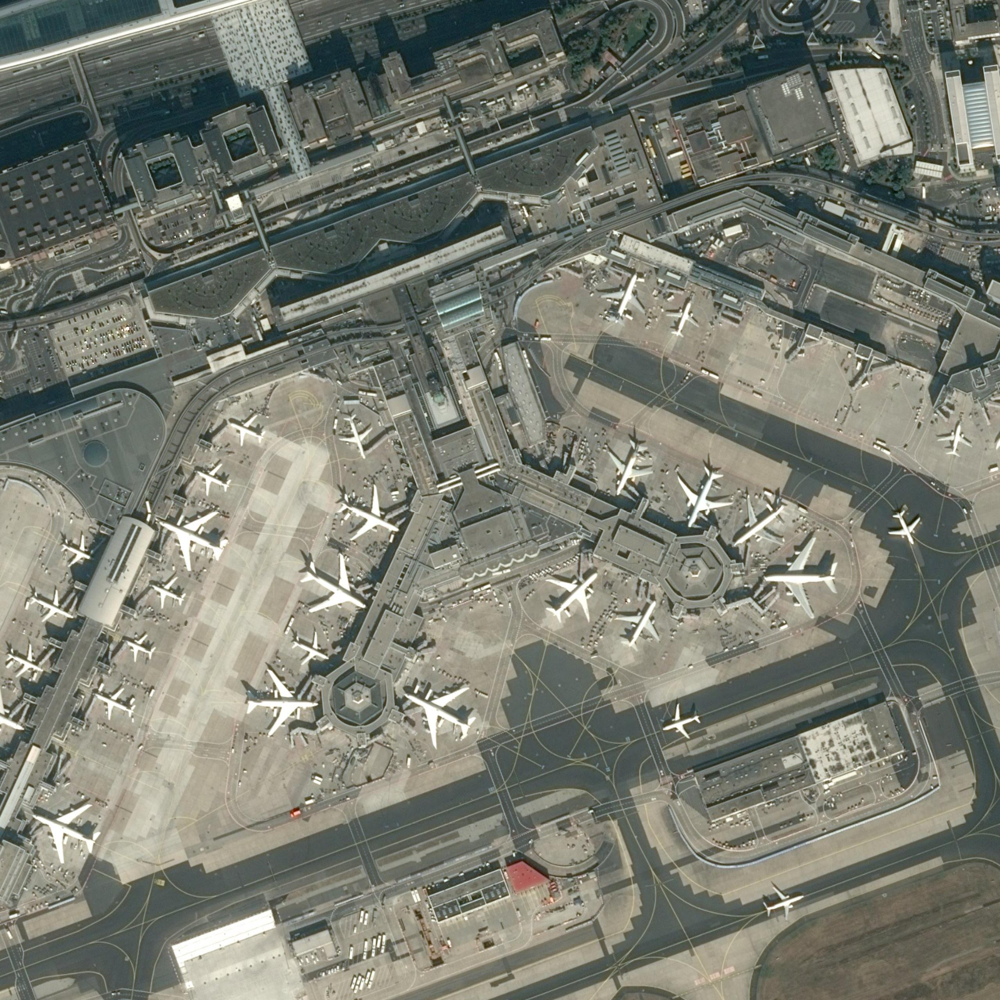

In [17]:
direc = Path('/home/akz-workhorse/programming/NASA-Hackathon/Satellite_Imagery/archive')
image_list = list(direc.glob('images/*.jpg'))
random_image = random.choice(image_list)
image = PIL.Image.open(random_image)
display(image)


In [18]:
jpg_files = [direc / f.name for f in image_list if os.path.isfile(f) and f.name[-4:] == ".jpg"]
print("{} jpg files in {}".format(len(jpg_files), direc))

HEIGHT, WIDTH = image.size
channels = len(image.mode)
print("Image size: {}".format((HEIGHT, WIDTH)))
print("RGB channels: {}".format(channels))


103 jpg files in /home/akz-workhorse/programming/NASA-Hackathon/Satellite_Imagery/archive
Image size: (2560, 2560)
RGB channels: 3


In [19]:
def f(x): 
    return ast.literal_eval(x.rstrip('\r\n'))

df = pd.read_csv(direc / "annotations.csv", 
                converters={'geometry': f, 'class': lambda o: 'plane'})
df.head(10)

,id,image_id,geometry,class
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",plane
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",plane
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",plane
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",plane
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",plane
5,6,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(451, 725), (524, 725), (524, 798), (451, 798...",plane
6,7,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1543, 1437), (1614, 1437), (1614, 1497), (15...",plane
7,8,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1485, 1370), (1561, 1370), (1561, 1437), (14...",plane
8,9,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1968, 1624), (2053, 1624), (2053, 1687), (19...",plane
9,10,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1659, 1674), (1733, 1674), (1733, 1746), (16...",plane


In [20]:
def obtenirLimites(geometry):
    try: 
        arr = np.array(geometry).T
        xmin = np.min(arr[0])
        ymin = np.min(arr[1])
        xmax = np.max(arr[0])
        ymax = np.max(arr[1])
        return (xmin, ymin, xmax, ymax)
    except:
        return np.nan

def obtenirLargeur(boundingbox):
    try: 
        (xmin, ymin, xmax, ymax) = boundingbox
        return np.abs(xmax - xmin)
    except:
        return np.nan

def obtenirHauteur(boundingbox):
    try: 
        (xmin, ymin, xmax, ymax) = boundingbox
        return np.abs(ymax - ymin)
    except:
        return np.nan

df.loc[:,'boundingbox'] = df.loc[:,'geometry'].apply(obtenirLimites)
df.loc[:,'Largeur'] = df.loc[:,'boundingbox'].apply(obtenirLargeur)
df.loc[:,'Hauteur'] = df.loc[:,'boundingbox'].apply(obtenirHauteur)
df.head(10)

,id,image_id,geometry,class,boundingbox,Largeur,Hauteur
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",plane,"(135, 522, 245, 600)",110,78
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",plane,"(1025, 284, 1125, 384)",100,100
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",plane,"(1058, 1503, 1130, 1568)",72,65
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",plane,"(813, 1518, 885, 1604)",72,86
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",plane,"(594, 938, 657, 1012)",63,74
5,6,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(451, 725), (524, 725), (524, 798), (451, 798...",plane,"(451, 725, 524, 798)",73,73
6,7,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1543, 1437), (1614, 1437), (1614, 1497), (15...",plane,"(1543, 1437, 1614, 1497)",71,60
7,8,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1485, 1370), (1561, 1370), (1561, 1437), (14...",plane,"(1485, 1370, 1561, 1437)",76,67
8,9,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1968, 1624), (2053, 1624), (2053, 1687), (19...",plane,"(1968, 1624, 2053, 1687)",85,63
9,10,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1659, 1674), (1733, 1674), (1733, 1746), (16...",plane,"(1659, 1674, 1733, 1746)",74,72


In [21]:
fold = 1 
num_fold = 5 
index = df['image_id'].unique()
val_indexes = index[len(index)*fold//num_fold:len(index)*(fold+1)//num_fold]

In [25]:
import os 
import tqdm.notebook
import numpy as np
from pathlib import Path
import PIL
import pandas as pd

TILE_Width = 512 
TILE_Height = 512
TILE_Overlap = 64
truncation = 0.3
overwrite = True 

TILE_directory = {'train': Path('archive/images'),
                  'val': Path('archive/images')}
for _, folder in TILE_directory.items():
    if not os.path.isdir(folder):
        os.makedirs(folder)

LABEL_directory = {'train': Path('archive/'),
                   'val': Path('archive/')}
for _, folder in LABEL_directory.items():
    if not os.path.isdir(folder):
        os.makedirs(folder)

def label_inside_tile(boundingbox, x_1, y_1, Width, Height, truncation):
    x_min, y_min, x_max, y_max = boundingbox
    x_min, y_min, x_max, y_max = x_min - x_1, y_min - y_1, x_max - x_1, y_max - y_1

    if (x_min > Width) or (x_max < 0.0) or (y_min > Height) or (y_max < 0.0):
        return None
    
    x_maxtrunc = min(x_max, Width) 
    x_mintrunc = max(x_min, 0) 
    if (x_maxtrunc - x_mintrunc) / (x_max - x_min) < truncation:
        return None

    y_maxtrunc = min(y_max, Width) 
    y_mintrunc = max(y_min, 0) 
    if (y_maxtrunc - y_mintrunc) / (y_max - y_min) < truncation:
        return None
        
    x_center = (x_mintrunc + x_maxtrunc) / 2.0 / Width
    y_center = (y_mintrunc + y_maxtrunc) / 2.0 / Height
    x_extent = (x_maxtrunc - x_mintrunc) / Width
    y_extent = (y_maxtrunc - y_mintrunc) / Height
    
    return (0, x_center, y_center, x_extent, y_extent)

# Load the image and associated data
for image_path in tqdm.notebook.tqdm(image_list):
    pil_image = PIL.Image.open(image_path, mode='r')
    np_image = np.array(pil_image, dtype=np.uint8)
    labels_image = df[df["image_id"] == image_path.name]
    
    # Calculate the number of tiles to create based on overlap
    X_TILES = (WIDTH + TILE_Width - TILE_Overlap - 1) // (TILE_Width - TILE_Overlap)
    Y_TILES = (HEIGHT + TILE_Height - TILE_Overlap - 1) // (TILE_Height - TILE_Overlap)
    
    for x in range(X_TILES):
        for y in range(Y_TILES):

            x_2 = min((x + 1) * TILE_Width - TILE_Overlap * (x != 0), WIDTH)
            x_1 = x_2 - TILE_Width
            y_2 = min((y + 1) * TILE_Height - TILE_Overlap * (y != 0), HEIGHT)
            y_1 = y_2 - TILE_Height
            
            # Determine the folder (train or validation) based on the image
            folder = 'val' if image_path.name in val_indexes else 'train'
            tile_path = TILE_directory[folder].joinpath(image_path.stem + "_" + str(x_1) + "_" + str(y_1) + ".jpg")
            label_path = LABEL_directory[folder].joinpath(image_path.stem + "_" + str(x_1) + "_" + str(y_1) + ".txt")
                
            # Save the tile if the file doesn't exist 
            if overwrite or not os.path.isfile(tile_path):
                tile_cut = np.zeros(shape=(TILE_Width, TILE_Height, 3), dtype=np.uint8)
                tile_cut[0:TILE_Height, 0:TILE_Width, :] = np_image[y_1:y_2, x_1:x_2, :]
                tile_cut_image = PIL.Image.fromarray(tile_cut)
                tile_cut_image.save(tile_path)

            found_label = [
                label_inside_tile(boundingbox, x_1, y_1, TILE_Width, TILE_Height, truncation)
                for i,boundingbox in enumerate(labels_image['boundingbox'])]
            found_label = [el for el in found_label if el is not None]

            with open(label_path, 'w+') as f:
                for label in found_label:
                    f.write(' '.join(str(x) for x in label) + '\n')


ImportError: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

In [48]:
CONFIG = """
# train and val datasets (image directory or *.txt file with image paths)
train: /kaggle/working/train/
val: /kaggle/working/val/

# number of classes
nc: 1

# class names
names: ['Aircraft']
"""

with open("dataset.yaml", "w") as f:
    f.write(CONFIG)

In [49]:
!pip uninstall -y wandb

Found existing installation: wandb 0.10.19
Uninstalling wandb-0.10.19:
  Successfully uninstalled wandb-0.10.19


In [50]:
!rm -rf /kaggle/working/runs

In [51]:
!python /kaggle/working/yolov5/train.py --cfg yolov5s.yaml --imgsz 512 --batch-size 16 --epochs 10 --data /kaggle/working/dataset.yaml --weights yolov5s.pt

train: weights=yolov5s.pt, cfg=yolov5s.yaml, data=/kaggle/working/dataset.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: Ultralytics requirements ['gitpython>=3.1.30', 'Pillow>=10.0.1', 'thop>=0.1.1'] not found, attempting AutoUpdate...
ERROR: Could not find a version that satisfies the requirement Pillow>=10.0.1
ERROR: No matching distribution found for Pillow>=10.0.1
You should consider upgrading via the '/o

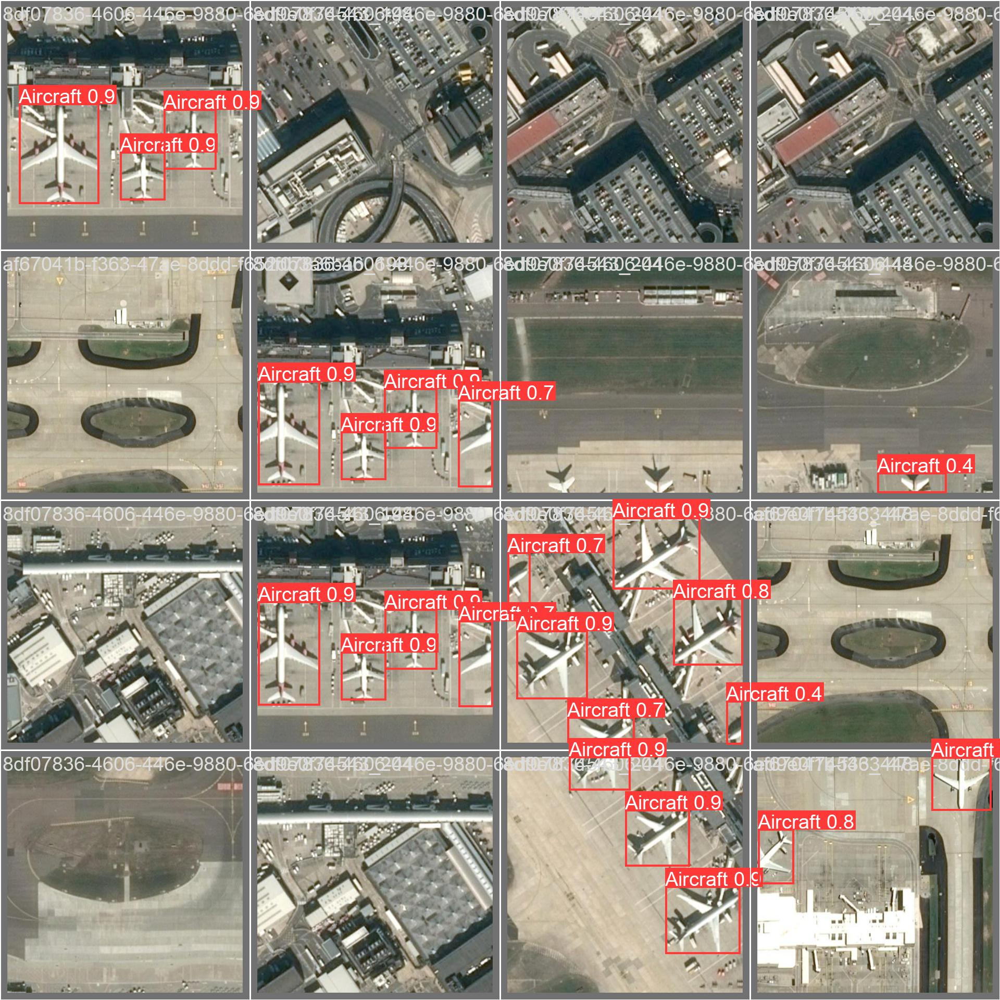

In [62]:
# prédiction
Image(filename='/yolov5/runs/train/exp2/val_batch1_pred.jpg', width=800)